In [1]:
import numpy as np
from Temporal_Community_Detection import temporal_network
from helpers import *
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, f1_score
from math import floor
import random
import csv
import matplotlib as mpl

/Users/bengieru/MLN/Results/Calcium_test/Temporal_Community_Detection.py:29: UserWarning: Graph-tool requires its own environment. Restart the kernel with a gt environment to run DSBM, otherwise you can proceed.
  warnings.warn(message = 'Graph-tool requires its own environment. Restart the kernel with a gt environment to run DSBM, otherwise you can proceed.')


In [2]:
path = '/Users/bengieru/MLN/Results/Calcium_test/' ## base path
roi = 'sarah_ROI/' #roi file
epochs = ['_baseline', '_early', '_pre']
layers = 4
time = 2000

subjects = load_obj(path + 'subjects/', 'subjects')

trackable = [subjects['wt'][3], subjects['het'][6], subjects['het'][8], subjects['het'][13], subjects['het'][4], subjects['het'][3], subjects['het'][2]]

pvs = {}
pvs['%s'%trackable[0]] = load_obj(path +'subjects/','pv_wt')['%s'%trackable[0]]
for i in range(1,len(trackable)):
    temp = load_obj(path +'subjects/','pv_het')['%s'%trackable[i]]
    pvs['%s'%trackable[i]] = (np.array(temp)-1).tolist() ##adjust python indexing

num_rois_trackable = {}
for i,e in enumerate(trackable):
    for j,f in enumerate(epochs):
        num_rois_trackable['%s'%(e+f)] = read_roi(path, roi, e+f) ## number of rois

In [3]:
spikes = {}
binned_binary_spikes = {}
merged_spikes = {}
for i,e in enumerate(trackable):
    for f in epochs:
        with open(path + 'infomap_results/' + '%s/'%e + 'binary_spikes_%s.pkl'%(e+f), 'rb') as handle:
            spikes['%s'%(e+f)] = pickle.load(handle)
        binned_binary_spikes['%s'%(e+f)] = bin_time_series(spikes['%s'%(e+f)], time, gaussian = True, sigma = 1.25)
    merged_spikes['%s'%e] = np.append(np.append(spikes['%s'%(e+epochs[0])], 
                                                spikes['%s'%(e+epochs[1])], axis = 1), 
                                      spikes['%s'%(e+epochs[2])], axis = 1)

In [4]:
%%time
adjacency_matrices = {}
for i,e in enumerate(trackable):
    for j,f in enumerate(epochs):  
        adjacencies = []
        for k in range(layers):
            adjacencies.append(cross_correlation_matrix(binned_binary_spikes['%s'%(e+f)][k])[0])
        adjacency_matrices['%s'%(e+f)] = adjacencies

/Users/bengieru/MLN/Results/Calcium_test/helpers.py:39: RuntimeWarning: invalid value encountered in sqrt
  x_cov_std = np.nanmax(np.sqrt(np.correlate(x - x_mean, x - x_mean, 'full')))
/Users/bengieru/MLN/Results/Calcium_test/helpers.py:40: RuntimeWarning: invalid value encountered in sqrt
  y_cov_std = np.nanmax(np.sqrt(np.correlate(y - y_mean, y - y_mean, 'full')))
/Users/bengieru/MLN/Results/Calcium_test/helpers.py:47: RuntimeWarning: invalid value encountered in true_divide
  corr_array = unnormalized_correlation/normalization


CPU times: user 28min 57s, sys: 17.5 s, total: 29min 14s
Wall time: 31min


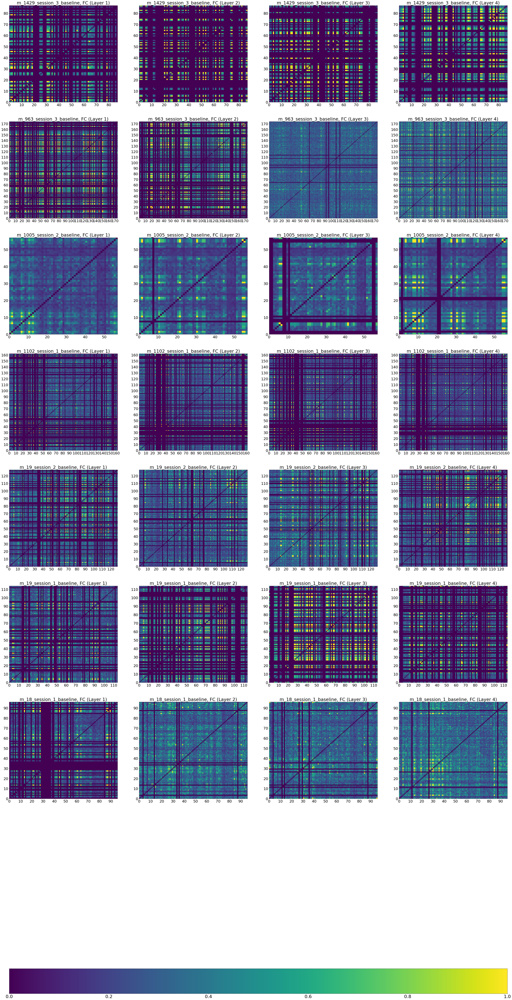

In [5]:
fig,ax = plt.subplots(7,4, figsize = (60,140))
for i,e in enumerate(trackable):
    for q in range(4):
        k = ax[i][q].imshow(adjacency_matrices['%s'%(e+epochs[0])][q], origin = 'lower', interpolation = 'nearest', aspect='auto',  extent = [0,num_rois_trackable['%s'%(e+epochs[0])],0,num_rois_trackable['%s'%(e+epochs[0])]])
        ax[i][q].set_title('%s, FC (Layer %d)'%(e+epochs[0], q + 1), fontsize = 30)
        ax[i][q].set_xticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[0])]/10)+1)])
        ax[i][q].set_yticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[0])]/10)+1)])
        ax[i][q].tick_params(axis = 'both', labelsize = 25)
cbar = fig.colorbar(k, ax = ax.flat, orientation = 'horizontal')
cbar.ax.tick_params(labelsize = 30) 

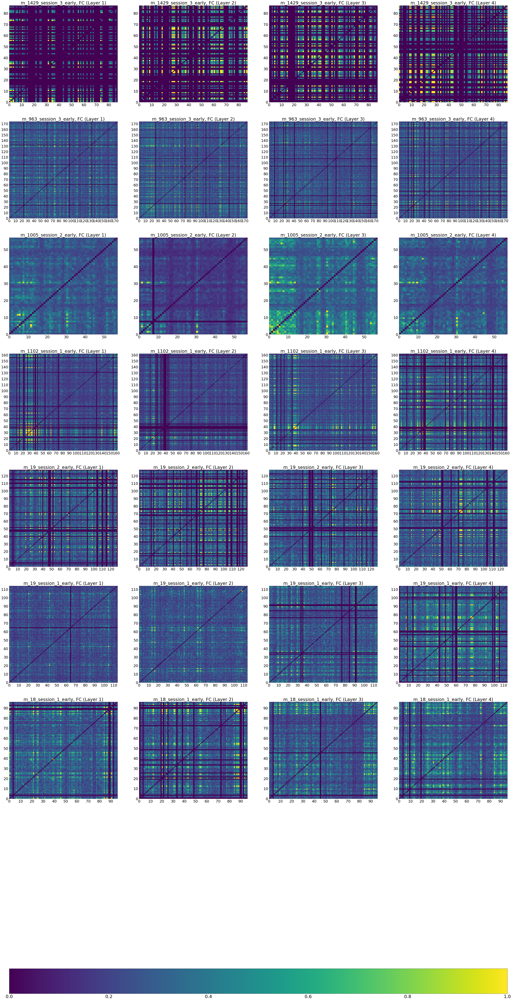

In [6]:
fig,ax = plt.subplots(7,4, figsize = (60,140))
for i,e in enumerate(trackable):
    for q in range(4):
        k = ax[i][q].imshow(adjacency_matrices['%s'%(e+epochs[1])][q], origin = 'lower', interpolation = 'nearest', aspect='auto',  extent = [0,num_rois_trackable['%s'%(e+epochs[1])],0,num_rois_trackable['%s'%(e+epochs[1])]])
        ax[i][q].set_title('%s, FC (Layer %d)'%(e+epochs[1], q + 1), fontsize = 30)
        ax[i][q].set_xticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[1])]/10)+1)])
        ax[i][q].set_yticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[1])]/10)+1)])
        ax[i][q].tick_params(axis = 'both', labelsize = 25)
cbar = fig.colorbar(k, ax = ax.flat, orientation = 'horizontal')
cbar.ax.tick_params(labelsize = 30) 

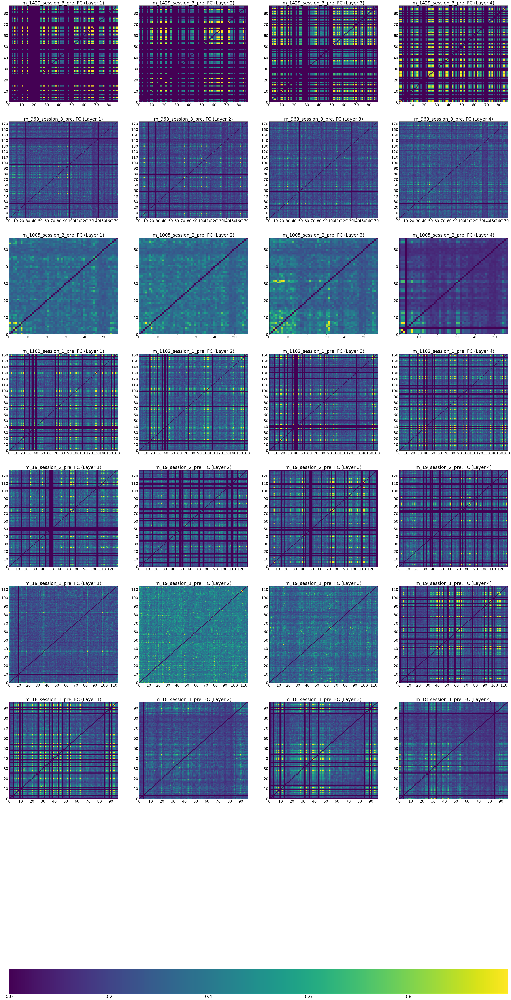

In [7]:
fig,ax = plt.subplots(7,4, figsize = (60,140))
for i,e in enumerate(trackable):
    for q in range(4):
        k = ax[i][q].imshow(adjacency_matrices['%s'%(e+epochs[2])][q], origin = 'lower', interpolation = 'nearest', aspect='auto',  extent = [0,num_rois_trackable['%s'%(e+epochs[2])],0,num_rois_trackable['%s'%(e+epochs[2])]])
        ax[i][q].set_title('%s, FC (Layer %d)'%(e+epochs[2], q + 1), fontsize = 30)
        ax[i][q].set_xticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[2])]/10)+1)])
        ax[i][q].set_yticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[2])]/10)+1)])
        ax[i][q].tick_params(axis = 'both', labelsize = 25)
cbar = fig.colorbar(k, ax = ax.flat, orientation = 'horizontal')
cbar.ax.tick_params(labelsize = 30) 

In [8]:
%%time
#fig,ax = plt.subplots(7,1, figsize = (40,80))
TNs = {}
for i,e in enumerate(trackable):
    for j,f in enumerate(epochs):
        TNs['%s'%(e+f)] = temporal_network(num_rois_trackable['%s'%(e+f)], 
                                    layers, 
                                    time, 
                                    data = 'list__adjacency', 
                                    list_adjacency = adjacency_matrices['%s'%(e+f)], 
                                    omega = 1, 
                                    kind = 'ordinal')
    #TNs['%s'%(e+epochs[0])].raster_plot(merged_spikes['%s'%e], ax[i])
    #ax[i].set_title('Raster plot for %s'%(e), fontsize = 23)
    #ax[i].hlines(pvs['%s'%trackable[i]][0], 0, 24000, colors = 'r', linestyles = 'dashed')

CPU times: user 1.32 s, sys: 132 ms, total: 1.45 s
Wall time: 1.65 s


In [9]:
membership = {}
threshs = np.linspace(0.1, 0.5, 9)
inters = np.linspace(0, 0.8, 9)
for k, e in enumerate(trackable):
    for f in epochs:
        with open(path + 'infomap_results/' + '%s/'%e + 'membership_%s.pkl'%(e+f), 'rb') as handle:
            membership['%s'%(e+f)] = pickle.load(handle)

In [11]:
trackable

['m_1429_session_3',
 'm_963_session_3',
 'm_1005_session_2',
 'm_1102_session_1',
 'm_19_session_2',
 'm_19_session_1',
 'm_18_session_1']

In [10]:
e = trackable[0]
f = epochs[0]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e+f)].community(membership['%s'%(e+f)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()

In [11]:
e = trackable[0]
f = epochs[1]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e+f)].community(membership['%s'%(e+f)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()

In [12]:
e = trackable[0]
f = epochs[2]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e+f)].community(membership['%s'%(e+f)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()

In [19]:
labels = {}
threshs = np.linspace(0.1, 0.5, 9)
inters = np.linspace(0, 0.8, 9)
for k, e in enumerate(trackable):
    for f in epochs:
        with open(path + 'infomap_results/' + '%s/'%e + 'labels_%s.pkl'%(e+f), 'rb') as handle:
            labels['%s'%(e+f)] = pickle.load(handle)
trackable,inters,threshs

(['m_1429_session_3',
  'm_963_session_3',
  'm_1005_session_2',
  'm_1102_session_1',
  'm_19_session_2',
  'm_19_session_1',
  'm_18_session_1'],
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ]))

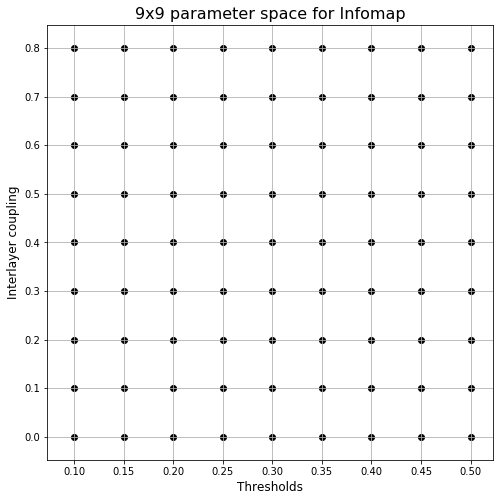

In [30]:
fig,ax = plt.subplots(1,1, figsize = (8,8))
for i in range(9):
    ax.scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax.set_xticks(threshs)
ax.set_yticks(inters)
ax.set_xlabel('Thresholds', fontsize = 12)
ax.set_ylabel('Interlayer coupling', fontsize = 12)
ax.set_title('9x9 parameter space for Infomap', fontsize = 16)
ax.grid(True)

## Control

In [42]:
e = trackable[0]
f = epochs[0]
n = num_rois_trackable['%s'%(e+f)]##
t = 4
max_recovery1 = np.zeros((18,n*t))##
for i in range(1,len(inters)):##
    max_recovery1[(i-1)*2:(i)*2] = labels['%s'%(e+f)][i*len(inters)+6:i*len(inters)+8]##
    
consensus_partition1 = community_consensus_iterative(max_recovery1)##

comms1, cmap1, color1 = consensus_display(consensus_partition1, n, t)##

In [43]:
e = trackable[0]
f = epochs[1]
n = num_rois_trackable['%s'%(e+f)]##
t = 4
max_recovery2 = np.zeros((18,n*t))##
for i in range(1,len(inters)):##
    max_recovery2[(i-1)*2:(i)*2] = labels['%s'%(e+f)][i*len(inters)+6:i*len(inters)+8]##
    
consensus_partition2 = community_consensus_iterative(max_recovery2)##

comms2, cmap2, color2 = consensus_display(consensus_partition2, n, t)##

In [44]:
e = trackable[0]
f = epochs[2]
n = num_rois_trackable['%s'%(e+f)]##
t = 4
max_recovery3 = np.zeros((18,n*t))##
for i in range(1,len(inters)):##
    max_recovery3[(i-1)*2:(i)*2] = labels['%s'%(e+f)][i*len(inters)+5:i*len(inters)+7]##
    
consensus_partition3 = community_consensus_iterative(max_recovery3)##

comms3, cmap3, color3 = consensus_display(consensus_partition3, n, t)##

In [45]:
colors = [color1, color2, color3]
cmap = mpl.colors.ListedColormap(colors[np.argmax([len(color1), len(color2), len(color3)])])

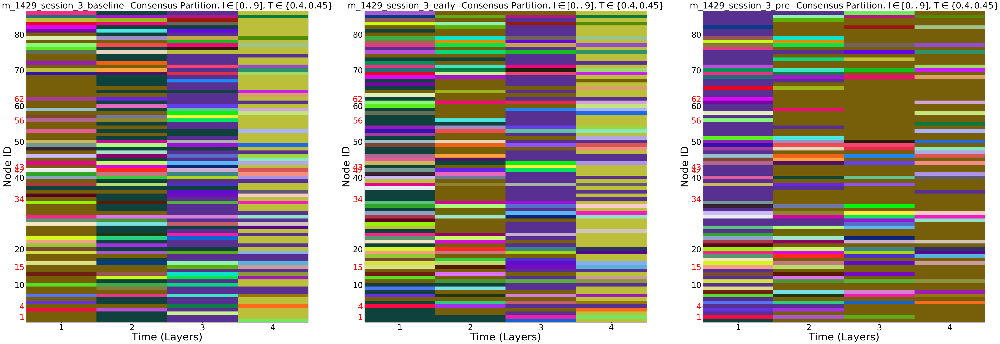

In [46]:
fig,ax = plt.subplots(1,3,figsize = (75,25))
ax[0].imshow(comms1, interpolation = 'none', cmap = cmap, 
          aspect = 'auto', origin = 'lower', extent = [0.5,t+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4,0.45\}$'%(e+epochs[0]), fontsize = 38)
ax[0].set_xlabel('Time (Layers)', fontsize = 45)
ax[0].set_ylabel('Node ID', fontsize = 45)
ax[0].set_xticks([1,2,3,4])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 35)

ax[1].imshow(comms2, interpolation = 'none', cmap = cmap, 
          aspect = 'auto', origin = 'lower', extent = [0.5,t+0.5,-0.5,n-0.5])
ax[1].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4,0.45\}$'%(e+epochs[1]), fontsize = 38)
ax[1].set_xlabel('Time (Layers)', fontsize = 45)
ax[1].set_ylabel('Node ID', fontsize = 45)
ax[1].set_xticks([1,2,3,4])
ax[1].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[1].get_yticklabels()[i].set_color("red")
ax[1].tick_params(axis = 'both', labelsize = 35)

ax[2].imshow(comms3, interpolation = 'none', cmap = cmap, 
          aspect = 'auto', origin = 'lower', extent = [0.5,t+0.5,-0.5,n-0.5])
ax[2].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4,0.45\}$'%(e+epochs[2]), fontsize = 38)
ax[2].set_xlabel('Time (Layers)', fontsize = 45)
ax[2].set_ylabel('Node ID', fontsize = 45)
ax[2].set_xticks([1,2,3,4])
ax[2].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[2].get_yticklabels()[i].set_color("red")
ax[2].tick_params(axis = 'both', labelsize = 35)

CPU times: user 22.7 s, sys: 1.59 s, total: 24.3 s
Wall time: 17.4 s


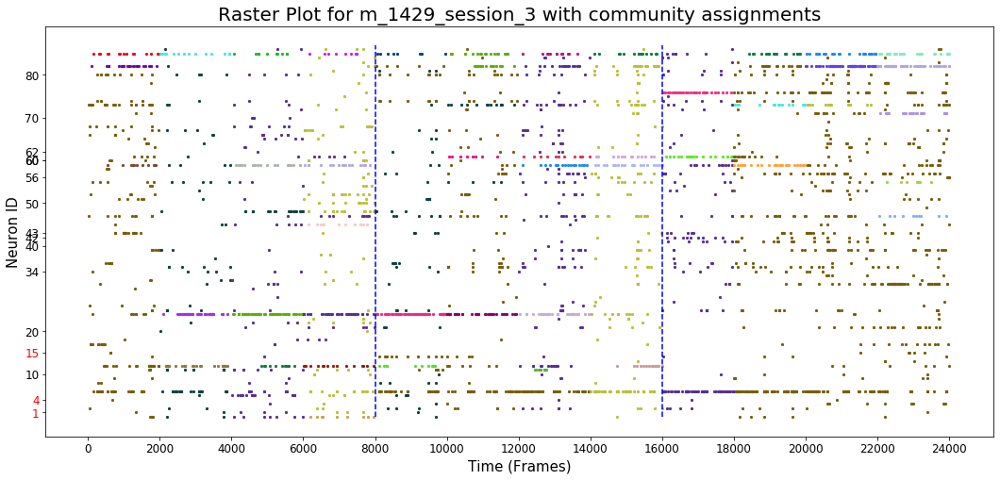

In [48]:
%%time
binsize = 2000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

clr = np.append(np.append(comms1,comms2, axis = 1),comms3, axis = 1)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  sp[1][i], s = 5, 
               c = color[int(clr[sp[1][i]][sp[0][i]])], marker = 'x', cmap = cmap)
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80])
for i,k in enumerate(pvs['%s'%(e)]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')

In [54]:
sp

(array([ 0,  0,  0, ..., 11, 11, 11]),
 array([ 0,  0,  0, ..., 85, 86, 86]),
 array([1719, 1776, 1802, ..., 1995, 1720, 1751]))

In [58]:
np.append(comms1,comms2, axis =1)

array([[  0.,   3.,   1., 126.,   3.,   3.,  98.,   2.],
       [  0.,   3.,   1.,   2.,   3.,   3.,  99., 131.],
       [  0.,   3.,  85.,   2.,   3.,   0.,   1.,   2.],
       [  4.,  45.,   1.,   2.,   3.,   0.,   0., 132.],
       [  0.,   0.,  86., 127.,   4.,  55.,   1.,   1.],
       [  5.,   3.,   1.,   2.,   3.,  56., 100., 133.],
       [  0.,   3.,   1.,   2.,   0.,   0.,   0.,   2.],
       [  6.,  46.,  87., 128.,   5.,  57., 101., 134.],
       [  0.,   0.,   1.,   1.,   3.,   0.,   0.,   2.],
       [  0.,  47.,   1.,   1.,   6.,  58.,   1.,   2.],
       [  7.,  48.,  88.,   2.,   3.,   3.,   1.,   1.],
       [  0.,   3.,   1.,   2.,   0.,  59., 102., 135.],
       [  0.,  49.,  89., 129.,   7.,   0.,   1., 136.],
       [  8.,  50.,  90., 130.,   8.,  60.,   0.,   2.],
       [  0.,   0.,   1.,   1.,   0.,   0.,   1.,   1.],
       [  0.,   0.,  91., 131.,   9.,  61., 103., 137.],
       [  9.,  51.,  92., 132.,  10.,  62., 104., 138.],
       [  0.,   3.,   1.,   1.,

## Epileptic

In [59]:
e = trackable[-1]
f = epochs[0]
n = num_rois_trackable['%s'%(e+f)]##
t = 4
max_recovery1 = np.zeros((18,n*t))##
for i in range(1,len(inters)):##
    max_recovery1[(i-1)*2:(i)*2] = labels['%s'%(e+f)][i*len(inters)+6:i*len(inters)+8]##
    
consensus_partition1 = community_consensus_iterative(max_recovery1)##

comms1, cmap1, color1 = consensus_display(consensus_partition1, n, t)##

In [60]:
e = trackable[-1]
f = epochs[1]
n = num_rois_trackable['%s'%(e+f)]##
t = 4
max_recovery2 = np.zeros((18,n*t))##
for i in range(1,len(inters)):##
    max_recovery2[(i-1)*2:(i)*2] = labels['%s'%(e+f)][i*len(inters)+6:i*len(inters)+8]##
    
consensus_partition2 = community_consensus_iterative(max_recovery2)##

comms2, cmap2, color2 = consensus_display(consensus_partition2, n, t)##

In [61]:
e = trackable[-1]
f = epochs[2]
n = num_rois_trackable['%s'%(e+f)]##
t = 4
max_recovery3 = np.zeros((18,n*t))##
for i in range(1,len(inters)):##
    max_recovery3[(i-1)*2:(i)*2] = labels['%s'%(e+f)][i*len(inters)+5:i*len(inters)+7]##
    
consensus_partition3 = community_consensus_iterative(max_recovery3)##

comms3, cmap3, color3 = consensus_display(consensus_partition3, n, t)##

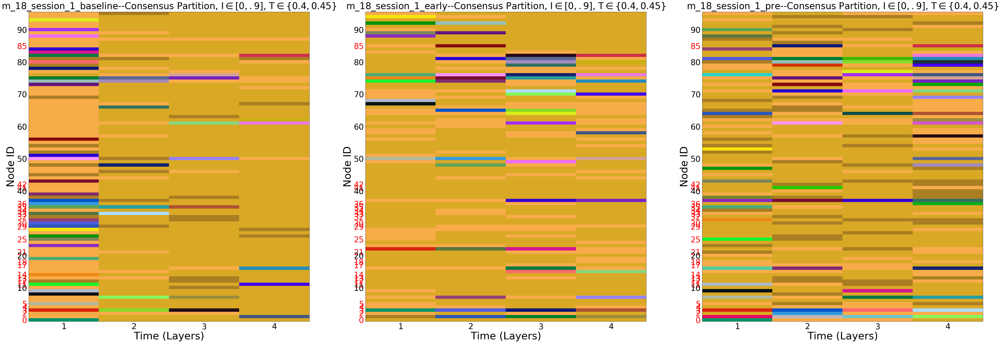

In [62]:
fig,ax = plt.subplots(1,3,figsize = (75,25))
ax[0].imshow(comms1, interpolation = 'none', cmap = cmap3, 
          aspect = 'auto', origin = 'lower', extent = [0.5,t+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4,0.45\}$'%(e+epochs[0]), fontsize = 40)
ax[0].set_xlabel('Time (Layers)', fontsize = 45)
ax[0].set_ylabel('Node ID', fontsize = 45)
ax[0].set_xticks([1,2,3,4])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 35)

ax[1].imshow(comms2, interpolation = 'none', cmap = cmap3, 
          aspect = 'auto', origin = 'lower', extent = [0.5,t+0.5,-0.5,n-0.5])
ax[1].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4,0.45\}$'%(e+epochs[1]), fontsize = 40)
ax[1].set_xlabel('Time (Layers)', fontsize = 45)
ax[1].set_ylabel('Node ID', fontsize = 45)
ax[1].set_xticks([1,2,3,4])
ax[1].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[1].get_yticklabels()[i].set_color("red")
ax[1].tick_params(axis = 'both', labelsize = 35)

ax[2].imshow(comms3, interpolation = 'none', cmap = cmap3, 
          aspect = 'auto', origin = 'lower', extent = [0.5,t+0.5,-0.5,n-0.5])
ax[2].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4,0.45\}$'%(e+epochs[2]), fontsize = 40)
ax[2].set_xlabel('Time (Layers)', fontsize = 45)
ax[2].set_ylabel('Node ID', fontsize = 45)
ax[2].set_xticks([1,2,3,4])
ax[2].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[2].get_yticklabels()[i].set_color("red")
ax[2].tick_params(axis = 'both', labelsize = 35)

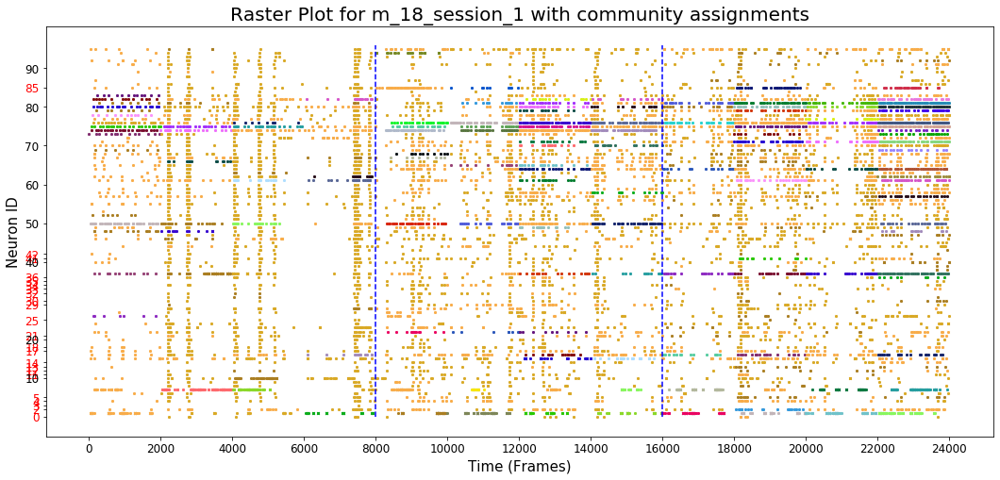

In [63]:
binsize = 2000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

clr = np.append(np.append(comms1,comms2, axis = 1), comms3, axis = 1)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  sp[1][i], s = 5, 
               c = color3[int(clr[sp[1][i]][sp[0][i]])], marker = 'x', cmap = cmap3)
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000,0,n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000,0,n, colors = 'b', linestyle = 'dashed')